In [1]:
# Load Pkgs
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
#Il comando successivo restituisce un output per righe di codice, ma jupyter lo fà già da sé
#%matplotlib inline
import matplotlib.colors as mcolors
from random import randint
import seaborn as sns


In [2]:
def draw(G, pos, measures, measure_name):
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1))
    
    # labels = nx.draw_networkx_labels(G, pos)
    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

In [4]:
df = pd.read_csv("tvshow_edges.csv")
#df = pd.read_csv("edges.csv",header=None, names=['data'])
#Separo il dataframe in due colonne source e target, il file inseriva i dati infatti in una sola colonna e separava i dati con una virgola
#df[['source', 'target']] =df['data'].str.split(',', expand=True).astype(int)

In [5]:
# Read Our Edgelist
us_graph = nx.from_pandas_edgelist(df,source="node_1",target="node_2")
#us_graph = nx.from_pandas_edgelist(df, source="source",target="target")

In [6]:
numeroNodi=us_graph.number_of_nodes()
numeroArchi=us_graph.number_of_edges()
#Elenco nodi
listaNodi=list(us_graph.nodes)
#Elenco collegamenti tra nodi
listaArchi=list(us_graph.edges)
print("Numero Nodi :"+ str(numeroNodi) + "\t" + "Numero Archi: "+ str(numeroArchi) )

Numero Nodi :3892	Numero Archi: 17262


# Finora abbiamo solo valutato le caratteristiche del grafo più superficiali

In [7]:
bet = nx.betweenness_centrality(us_graph)
#Degree calcola la degree centrality normalizzata rispetto al numero di nodi al quale sono collegati i nodi presi in question
degree = nx.degree_centrality(us_graph)
#calcolo degree centrality
gradoNodi=dict(us_graph.degree)
betwCentr=dict(bet)
closCentr=dict(nx.closeness_centrality(us_graph))
#Degree centrality: valuta la centralità dei nodi in base al numero di connessioni con gli altri nodi
#La betweeness centrality mostra l'importanza di nodi che fanno da ponte tra gruppi di nodi altrimenti non raggiungibili
#La closeness centrality mostra quali sono i nodi che riescono a diffondere maggiormente informazioni per tutto il grafo
nx.set_node_attributes(us_graph,gradoNodi,'Size')
nx.set_node_attributes(us_graph,betwCentr,'Betweeness Centrality')
nx.set_node_attributes(us_graph,closCentr,'Closeness Centrality')


In [8]:
#Visualizzazione nodo a Degree Centrality più alta
gradiNodi_ordinati = dict(sorted(gradoNodi.items(), key=lambda item: item[1], reverse=True))
for nodo, centrality in gradiNodi_ordinati.items():
    print(f"Nodo: {nodo}, Degree Centrality: {centrality}")


Nodo: 2008, Degree Centrality: 126
Nodo: 3254, Degree Centrality: 126
Nodo: 3525, Degree Centrality: 108
Nodo: 1177, Degree Centrality: 104
Nodo: 1673, Degree Centrality: 102
Nodo: 3156, Degree Centrality: 101
Nodo: 1595, Degree Centrality: 100
Nodo: 3122, Degree Centrality: 100
Nodo: 2659, Degree Centrality: 97
Nodo: 1840, Degree Centrality: 97
Nodo: 2036, Degree Centrality: 95
Nodo: 566, Degree Centrality: 95
Nodo: 1073, Degree Centrality: 94
Nodo: 603, Degree Centrality: 89
Nodo: 3519, Degree Centrality: 86
Nodo: 386, Degree Centrality: 81
Nodo: 1961, Degree Centrality: 79
Nodo: 48, Degree Centrality: 79
Nodo: 354, Degree Centrality: 75
Nodo: 229, Degree Centrality: 74
Nodo: 1506, Degree Centrality: 73
Nodo: 2589, Degree Centrality: 72
Nodo: 72, Degree Centrality: 71
Nodo: 3164, Degree Centrality: 71
Nodo: 11, Degree Centrality: 70
Nodo: 545, Degree Centrality: 70
Nodo: 452, Degree Centrality: 69
Nodo: 1184, Degree Centrality: 69
Nodo: 1060, Degree Centrality: 67
Nodo: 3507, Degree 

In [9]:
#Visualizzazione nodo a Degree Centrality più alta
closeness_ordinati = dict(sorted(closCentr.items(), key=lambda item: item[1], reverse=True))
for nodo, centrality in closeness_ordinati.items():
    print(f"Nodo: {nodo}, Closeness Centrality: {centrality}")

Nodo: 3254, Closeness Centrality: 0.2609832986786505
Nodo: 2008, Closeness Centrality: 0.2593827078194787
Nodo: 2895, Closeness Centrality: 0.25618909665525413
Nodo: 819, Closeness Centrality: 0.251860961874555
Nodo: 2751, Closeness Centrality: 0.2477712684666327
Nodo: 211, Closeness Centrality: 0.24425612052730697
Nodo: 160, Closeness Centrality: 0.24422545819733868
Nodo: 3837, Closeness Centrality: 0.24265668849391955
Nodo: 2885, Closeness Centrality: 0.24197761194029851
Nodo: 2035, Closeness Centrality: 0.2401407146824662
Nodo: 1214, Closeness Centrality: 0.2392253304641869
Nodo: 1053, Closeness Centrality: 0.23857992519467777
Nodo: 1206, Closeness Centrality: 0.23611869652284725
Nodo: 3122, Closeness Centrality: 0.235689623841541
Nodo: 1987, Closeness Centrality: 0.23504893077201885
Nodo: 3318, Closeness Centrality: 0.23469449303335546
Nodo: 2157, Closeness Centrality: 0.23411552346570397
Nodo: 1673, Closeness Centrality: 0.2324789388779351
Nodo: 1177, Closeness Centrality: 0.23144

In [10]:
#Visualizzazione nodo a Degree Centrality più alta
beetweeness_ordinati = dict(sorted(betwCentr.items(), key=lambda item: item[1], reverse=True))
for nodo, centrality in beetweeness_ordinati.items():
    print(f"Nodo: {nodo}, Betweeness Centrality: {centrality}")

Nodo: 3254, Betweeness Centrality: 0.10544488181477074
Nodo: 2008, Betweeness Centrality: 0.09352541687013526
Nodo: 819, Betweeness Centrality: 0.0804900367587108
Nodo: 2170, Betweeness Centrality: 0.07471499425323284
Nodo: 2751, Betweeness Centrality: 0.07465790776474893
Nodo: 2895, Betweeness Centrality: 0.06910198604847143
Nodo: 3038, Betweeness Centrality: 0.040569165908730546
Nodo: 2682, Betweeness Centrality: 0.03896683285298819
Nodo: 211, Betweeness Centrality: 0.037912318738099464
Nodo: 2589, Betweeness Centrality: 0.03424807353742939
Nodo: 160, Betweeness Centrality: 0.03222334425273599
Nodo: 655, Betweeness Centrality: 0.031281652512490724
Nodo: 1344, Betweeness Centrality: 0.030944190757100414
Nodo: 3212, Betweeness Centrality: 0.028105433487130554
Nodo: 3837, Betweeness Centrality: 0.026985799951988014
Nodo: 988, Betweeness Centrality: 0.026377224353382075
Nodo: 1227, Betweeness Centrality: 0.025772603878006013
Nodo: 528, Betweeness Centrality: 0.024734967209854113
Nodo: 30

In [11]:
#Eliminazione cicli e determinazione k core del grafo
listaArchiciclici=list(nx.selfloop_edges(us_graph))
#Vi sono delle pagine che hanno il "mi piace" a se stesse, vedere se eliminare e procedere con l'analisi o cambiare dataset
listaArchiciclici
us_graph.remove_edges_from(nx.selfloop_edges(us_graph))
kcore=nx.k_core(us_graph)

In [15]:
len(listaArchiciclici)

23

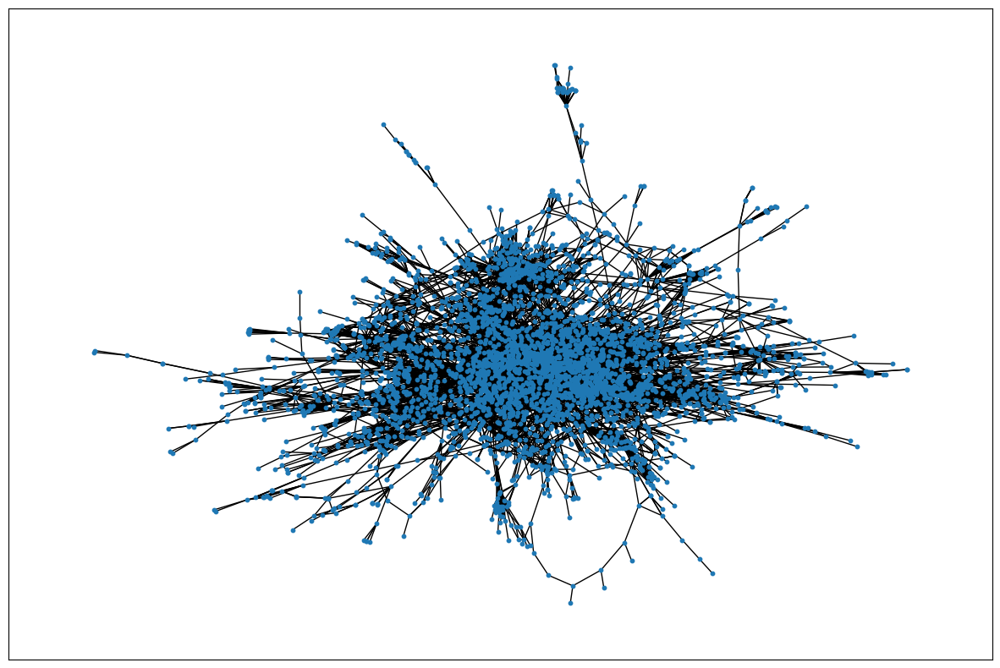

In [ ]:
#Semplice visualizzazione del grafo
pos = nx.spring_layout(us_graph)

plt.figure(figsize=(15,10))

nx.draw_networkx(us_graph, pos,node_size=10, with_labels=False)
plt.show()

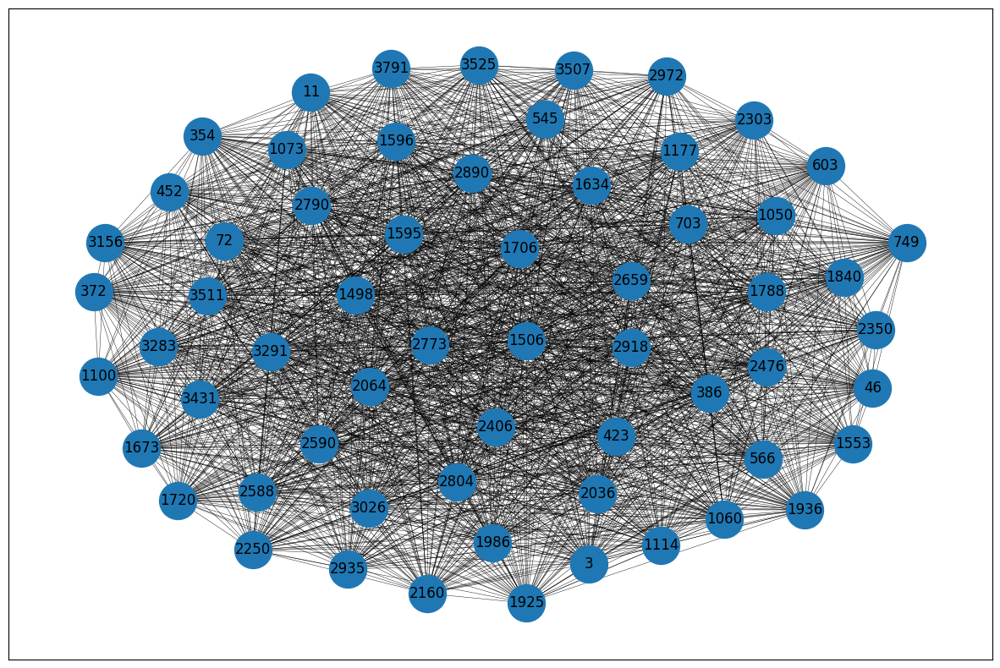

In [ ]:
#Visualizzazione k core
pos1 = nx.spring_layout(kcore)

plt.figure(figsize=(15,10))
nx.draw_networkx(kcore, pos=pos1, node_size=1000, with_labels=True, width=0.3)

In [ ]:

centralitakcore=nx.degree_centrality(kcore)

betkcore=nx.betweenness_centrality(kcore)

closkcore=nx.closeness_centrality(kcore)


# Trova i primi 10 nodi con la degree centrality più alta
nodi_top_10 = sorted(centralitakcore, key=centralitakcore.get, reverse=True)[:10]

# Stampa i primi 10 nodi con la degree centrality più alta
print("I primi 10 nodi con la degree centrality più alta:")
for i, nodo in enumerate(nodi_top_10, start=1):
    centrality_value = centralitakcore[nodo]
    print(f"{i}. Nodo: {nodo}, Degree Centrality: {centrality_value}")
    
# Trova i primi 10 nodi con la betweeness centrality più alta
nodi_top_10 = sorted(betkcore, key=betkcore.get, reverse=True)[:10]

# Stampa i primi 10 nodi con la betweeness centrality più alta
print("I primi 10 nodi con la betweeness centrality più alta:")
for i, nodo in enumerate(nodi_top_10, start=1):
    centrality_value = betkcore[nodo]
    print(f"{i}. Nodo: {nodo}, Betweeness Centrality: {centrality_value}")

# Trova i primi 10 nodi con la closeness centrality più alta
nodi_top_10 = sorted(closkcore, key=closkcore.get, reverse=True)[:10]

# Stampa i primi 10 nodi con la closeness centrality più alta
print("I primi 10 nodi con la closeness centrality più alta:")
for i, nodo in enumerate(nodi_top_10, start=1):
    centrality_value = closkcore[nodo]
    print(f"{i}. Nodo: {nodo}, closeness Centrality: {centrality_value}")


I primi 10 nodi con la degree centrality più alta:
1. Nodo: 386, Degree Centrality: 1.0
2. Nodo: 3, Degree Centrality: 1.0
3. Nodo: 1673, Degree Centrality: 1.0
4. Nodo: 11, Degree Centrality: 1.0
5. Nodo: 1936, Degree Centrality: 1.0
6. Nodo: 1553, Degree Centrality: 1.0
7. Nodo: 2064, Degree Centrality: 1.0
8. Nodo: 1177, Degree Centrality: 1.0
9. Nodo: 1050, Degree Centrality: 1.0
10. Nodo: 2588, Degree Centrality: 1.0
I primi 10 nodi con la betweeness centrality più alta:
1. Nodo: 386, Betweeness Centrality: 0.00010088781275221953
2. Nodo: 3, Betweeness Centrality: 0.00010088781275221953
3. Nodo: 1673, Betweeness Centrality: 0.00010088781275221953
4. Nodo: 11, Betweeness Centrality: 0.00010088781275221953
5. Nodo: 1936, Betweeness Centrality: 0.00010088781275221953
6. Nodo: 1553, Betweeness Centrality: 0.00010088781275221953
7. Nodo: 2064, Betweeness Centrality: 0.00010088781275221953
8. Nodo: 1177, Betweeness Centrality: 0.00010088781275221953
9. Nodo: 1050, Betweeness Centrality:

Possiamo notare che nel k-core per la degree, la closeness e la betweeness centrality vi sono sempre gli stessi nodi che primeggiano

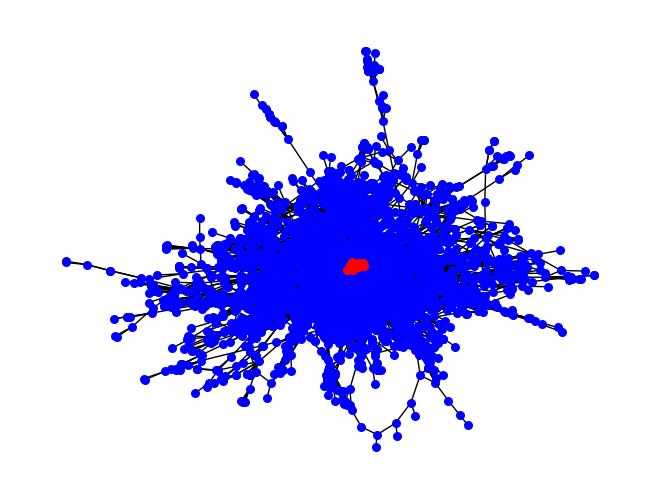

<Figure size 1500x1000 with 0 Axes>

In [ ]:

nx.draw(us_graph, pos, with_labels=False, node_color='b', node_size=30, font_size=1, font_color='w', font_weight='bold')
labels = {node: node for node in us_graph.nodes()}


# Evidenzia il k-core con un colore diverso
nx.draw(kcore, pos, with_labels=False, node_color='r', node_size=30, font_size=1, font_color='w', font_weight='bold')
labels = {node: node for node in kcore.nodes()}

plt.figure(figsize=(15,10))
# Visualizza il grafo
plt.show()

In [16]:
# Trova le cliques nel grafo 
cliques = list(nx.find_cliques(us_graph))

In [ ]:


# Creazione e visualizzazione dei sotto-grafi per ciascuna clique
for i, clique in enumerate(cliques, start=1):
    subgraph = us_graph.subgraph(clique)
    
    # Disegna il sotto-grafo
    plt.figure()
    pos4 = nx.spring_layout(subgraph)
    nx.draw(subgraph, pos4, with_labels=True,edge_color="blue", node_size=300, font_size=10, font_weight='bold')
    
    # Aggiungi etichette ai nodi
    labels = {node: node for node in clique}
    nx.draw_networkx_labels(subgraph, pos4, labels=labels)
    
    plt.title(f"Clique {i}")
    plt.show()

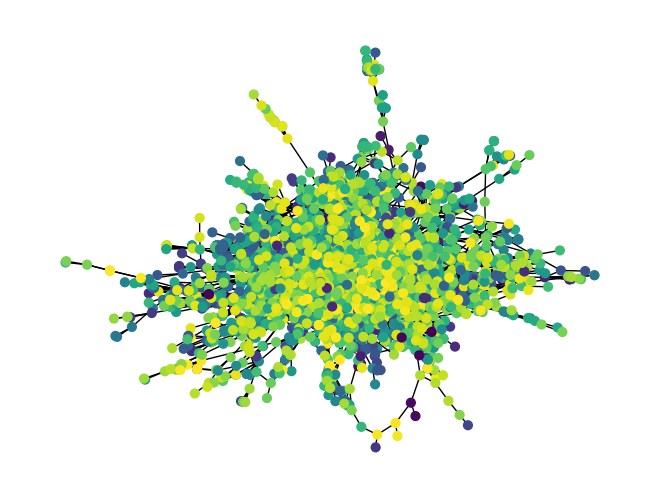

In [ ]:
# Creazione di un dizionario che assegna un colore diverso a ciascuna clique
colors = {}
for i, clique in enumerate(cliques):
    for node in clique:
        colors[node] = i

# Disegna il grafo intero colorando le cliques in modo differente
#pos = nx.spring_layout(us_graph)
node_colors = [colors[node] for node in us_graph.nodes()]
nx.draw(us_graph, pos, with_labels=False, node_color=node_colors, node_size=40)
#labels = {node: node for node in us_graph.nodes()}
#nx.draw_networkx_labels(us_graph, pos, labels=labels)

# Visualizza il grafo
plt.show()

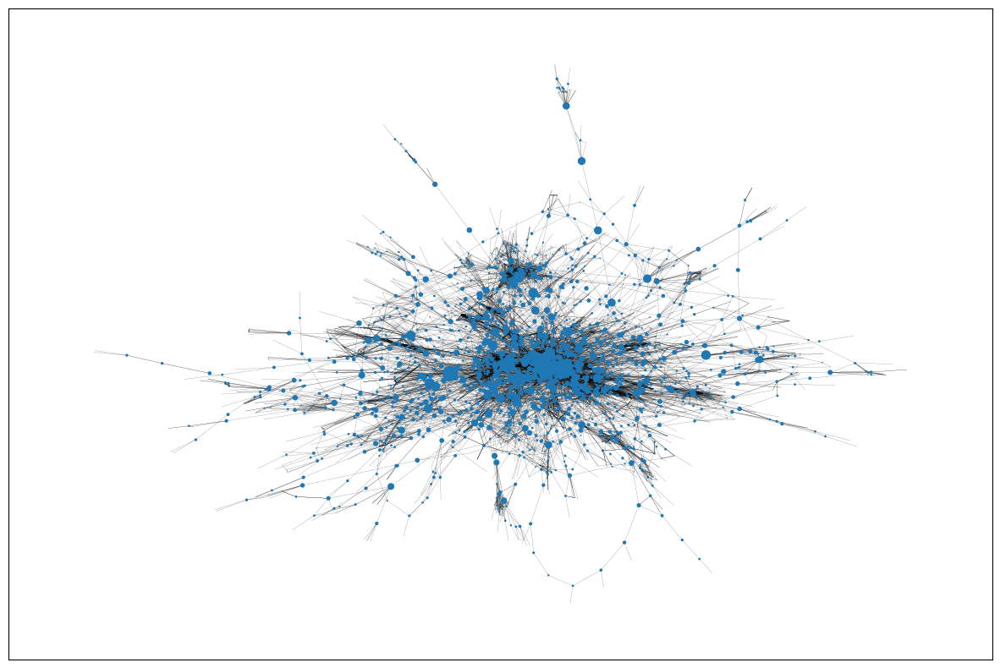

In [ ]:
#Generazione grafico ingrandendo i nodi con più InBetweeness Centrality 
node_size = [
   v*2000 for v in bet.values()
]  # definisco dimensioni variabili dei nodi in base alla loro centralità in betweeness
plt.figure(figsize=(15,10))
nx.draw_networkx(us_graph, pos=pos, node_size=node_size, with_labels=False, width=0.1)
#plt.axis("off")
#Per quanto si vedano i nodi che fanno da ponte il grafico in sè è ancora sgradevole

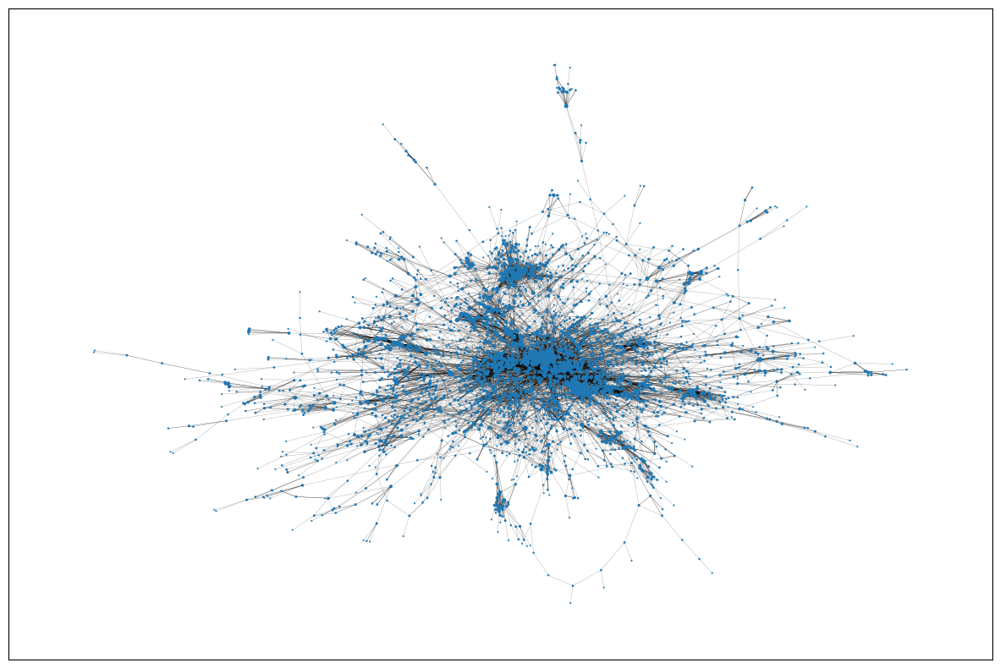

In [ ]:
#Generazione grafico ingrandendo i nodi con più Degree Centrality
node_size = [
   v*1200 for v in degree.values()
]  # definisco dimensioni variabili dei nodi in base a quanti altri nodi sono connessi
plt.figure(figsize=(15,10))
nx.draw_networkx(us_graph, pos=pos, node_size=node_size, with_labels=False, width=0.1)
#plt.axis("off")
#Anche questo grafico è brutto, bisogna provare qualche altra libreria oppure eliminare i nodi non interessanti


In [ ]:
#Ricerca communities nei grafi
colors = ["" for x in range(us_graph.number_of_nodes())]  # crea una lista di colori
counter = 0
for com in nx.community.louvain_communities(us_graph):
    color = "#%06X" % randint(0, 0xFFFFFF)  # creates random RGB color
    counter += 1
    for node in list(
        com
    ):  # colora le communities
        colors[node] = color
counter# Numero communities trovate


48

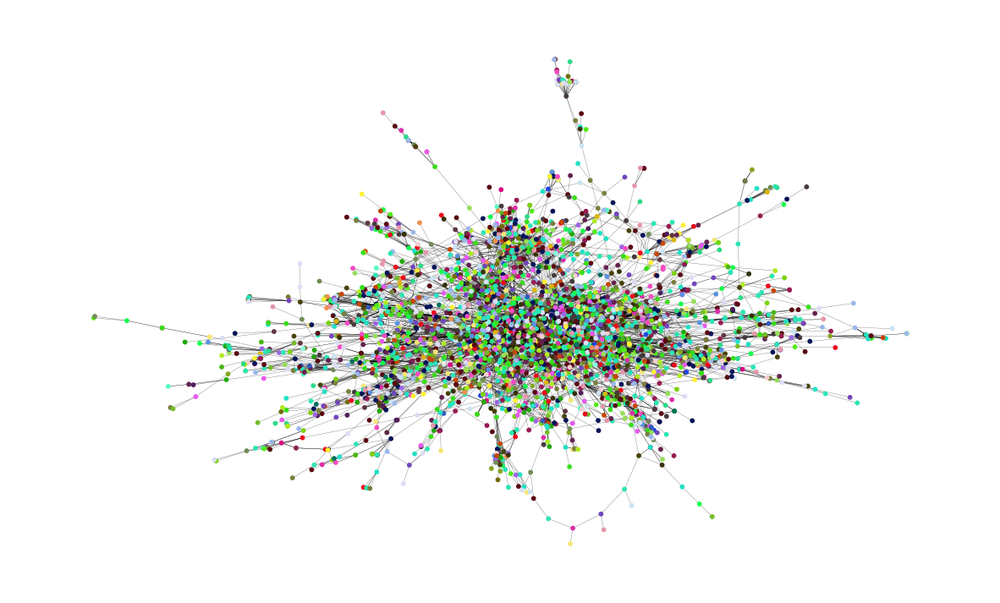

In [ ]:
#Risultato della generazione delle communities con l'algoritmo di Louvain
plt.figure(figsize=(15, 9))
plt.axis("off")
nx.draw_networkx(
    us_graph, pos=pos, node_size=10, with_labels=False, width=0.15, node_color=colors
)
# Il grafo ha troppi nodi, non si riescono a distinguere le communities

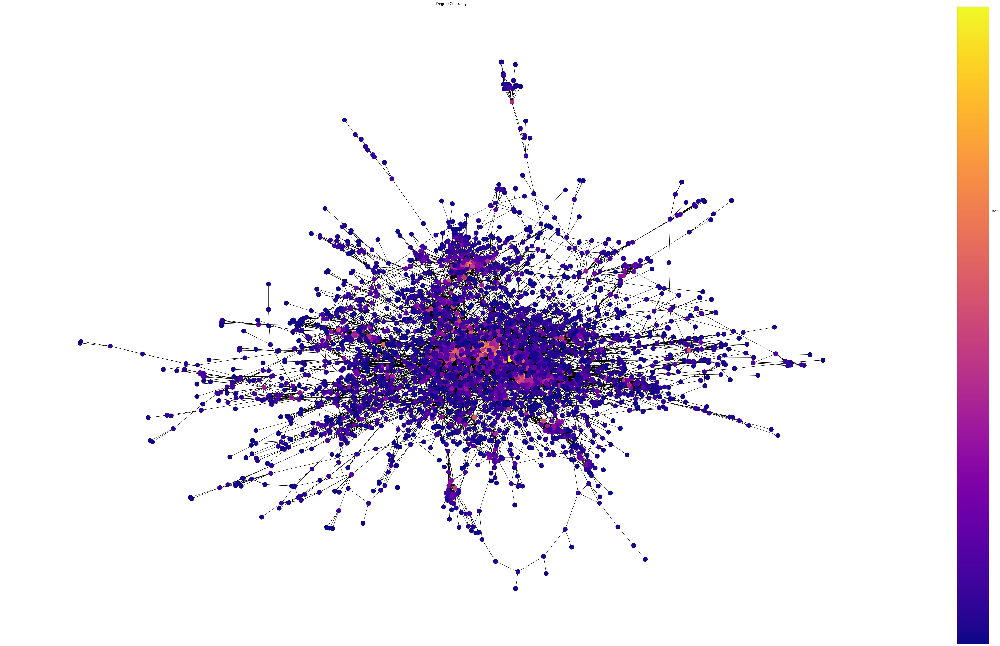

In [ ]:
#Grafico centralità dei nodi, valuta l'importanza dei nodi in base a quanti collegamenti hanno, più sono centrali più i colori sono caldi
plt.figure(figsize=(70,40))
draw(us_graph, pos, degree, 'Degree Centrality')

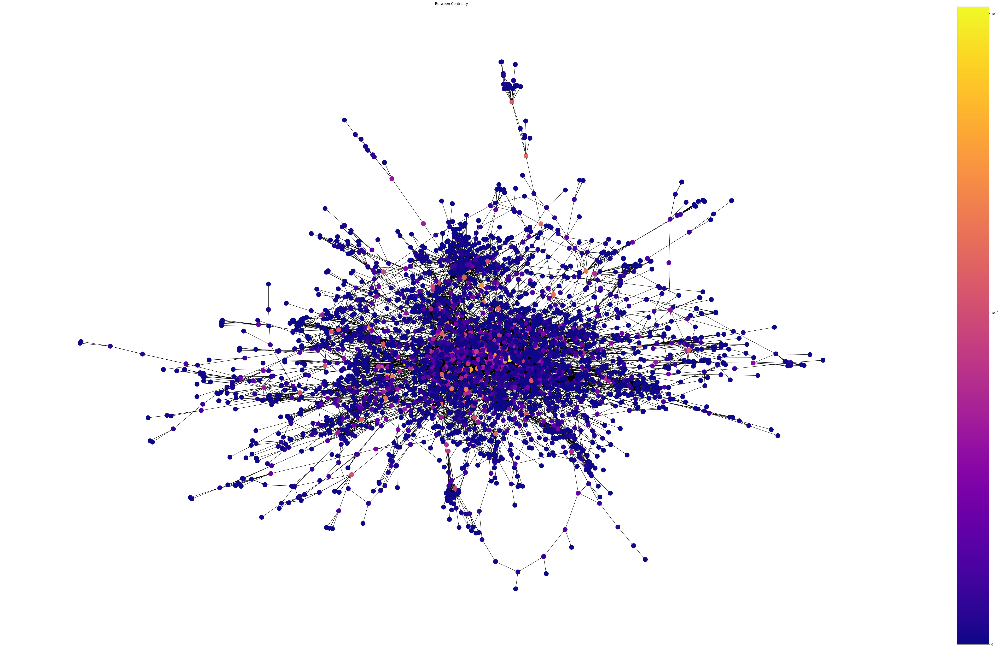

In [ ]:
plt.figure(figsize=(70,40))
draw(us_graph, pos, betwCentr, 'Between Centrality')

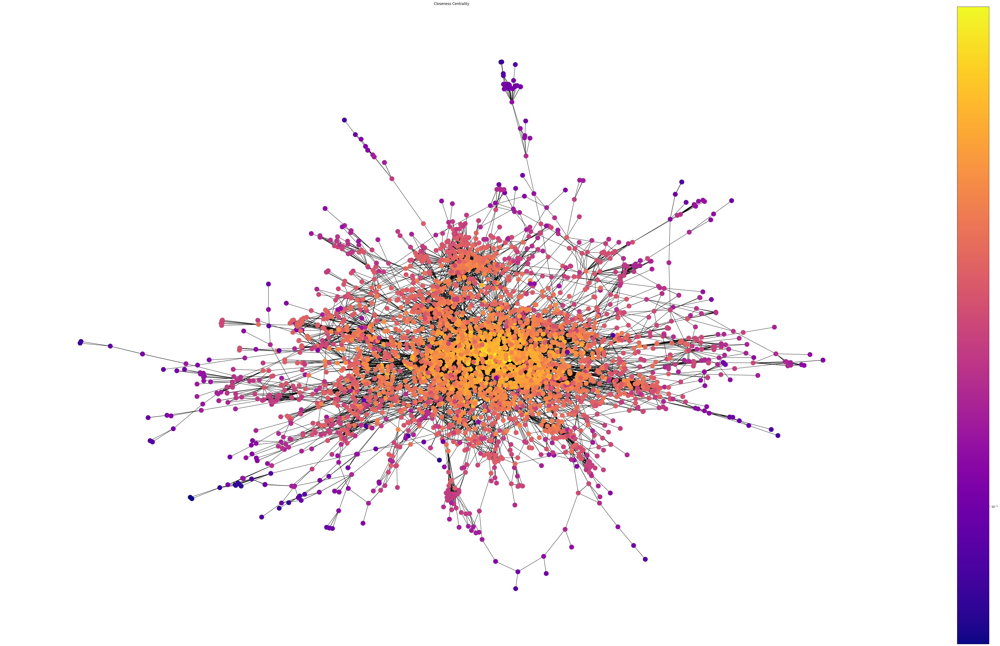

In [ ]:
plt.figure(figsize=(70,40))
draw(us_graph, pos, closCentr, 'Closeness Centrality')

C:\Users\F556Q-DM1218T\AppData\Local\Temp\ipykernel_15552\2930795080.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(list(closCentr.values()), kde=False)


Text(0, 0.5, 'Numero di nodi')

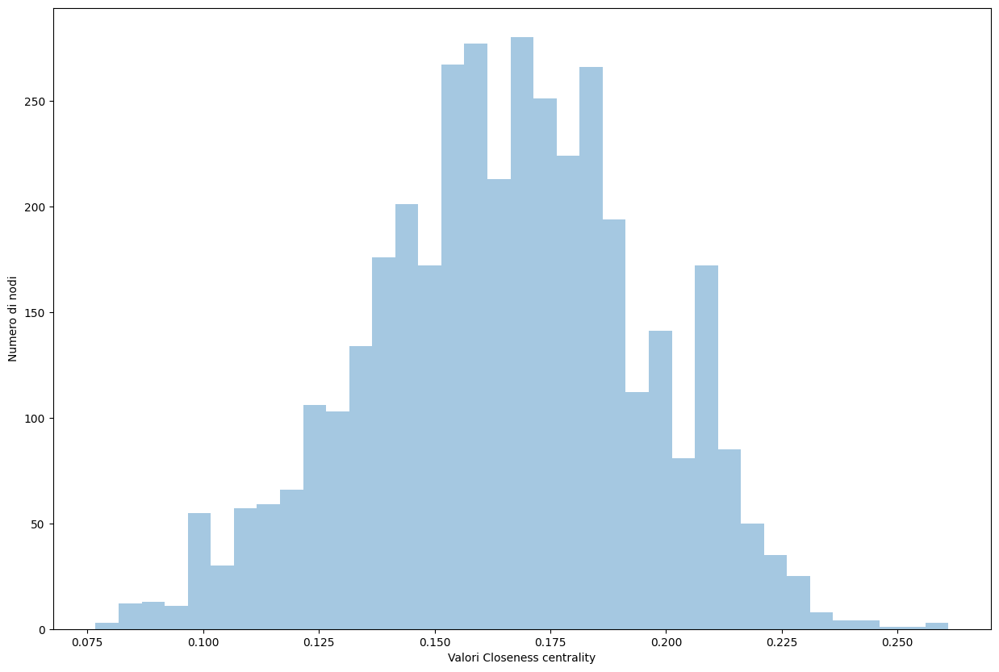

In [ ]:
plt.figure(figsize=(15,10))
sns.distplot(list(closCentr.values()), kde=False)
plt.xlabel("Valori Closeness centrality")
plt.ylabel("Numero di nodi")

C:\Users\F556Q-DM1218T\AppData\Local\Temp\ipykernel_15552\697648101.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(list(bet.values()), kde=False)


Text(0, 0.5, 'Numero di nodi con quella centralità')

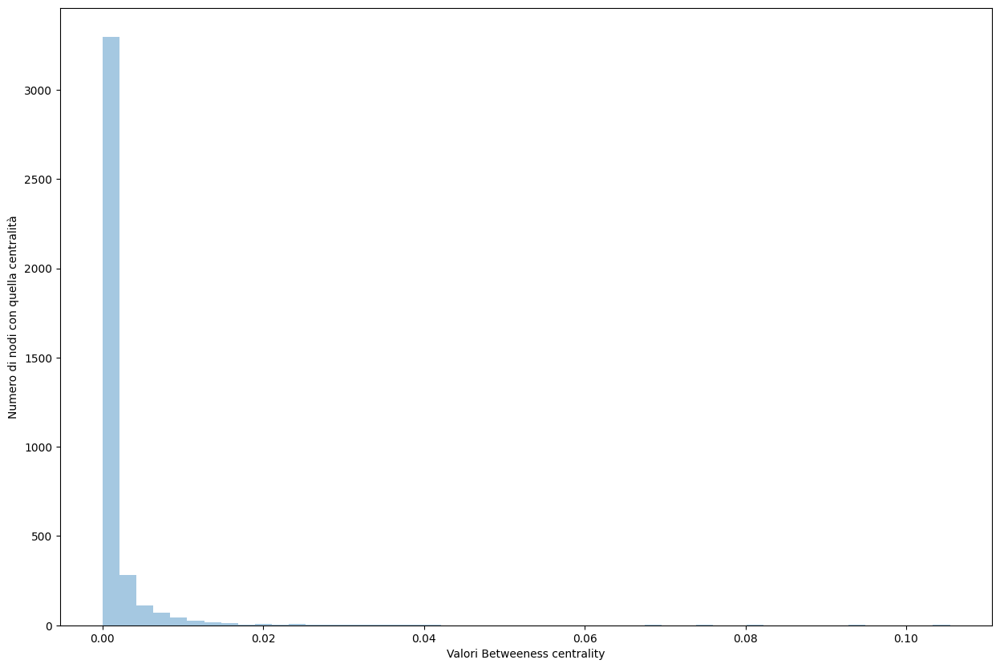

In [ ]:

plt.figure(figsize=(15,10))
sns.distplot(list(bet.values()), kde=False)
plt.xlabel("Valori Betweeness centrality")
plt.ylabel("Numero di nodi con quella centralità")

C:\Users\F556Q-DM1218T\AppData\Local\Temp\ipykernel_15552\646789661.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(list(gradoNodi.values()), kde=False)


Text(0, 0.5, 'Numero di nodi con quella centralità')

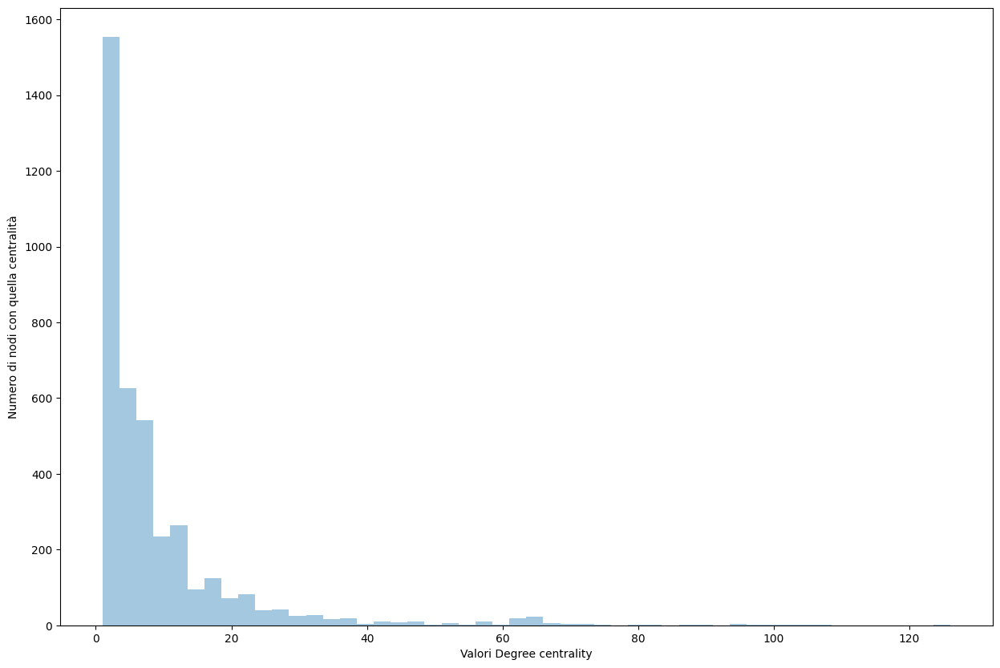

In [ ]:
plt.figure(figsize=(15,10))
sns.distplot(list(gradoNodi.values()), kde=False)
plt.xlabel("Valori Degree centrality")
plt.ylabel("Numero di nodi con quella centralità")

In [ ]:
#Da qui cerco di creare un grafo ora che abbia solo nodi che siano abbastanza popolari
G=us_graph
Gcentr=nx.degree_centrality(G)




In [ ]:
valori=[list(Gcentr.values())]
i=0
#Rimuoviamo tutti i nodi dal grafo G che abbiano meno di 0,003 di centralità
for node in list(Gcentr):
    if valori[0][i]<0.005:
        G.remove_node(node)
    i=i+1

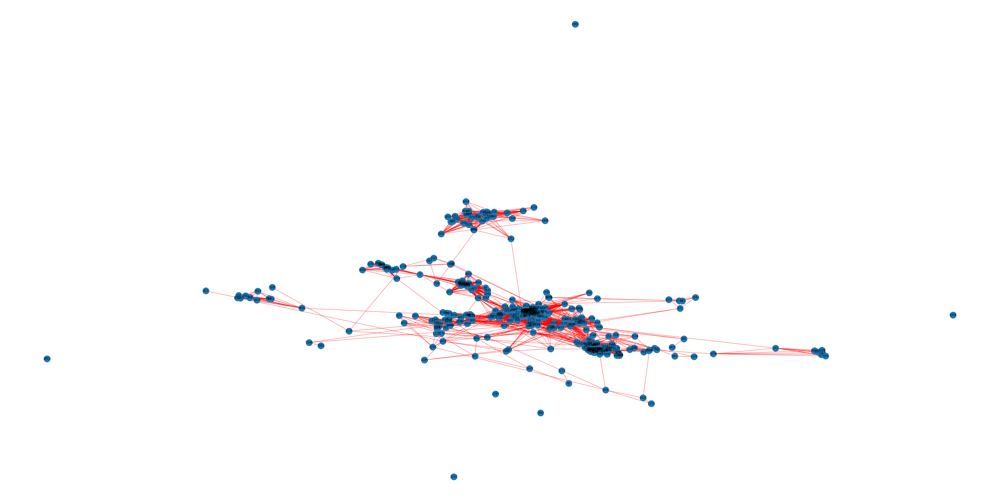

In [ ]:
plt.figure(figsize=(60,30))
#Mostriamo il risultato della cancellazione dei nodi
nx.draw(G, pos, with_labels=True,edge_color="red",node_size=800)
plt.show()

Text(0, 0.5, 'Numero di nodi con quella centralità')

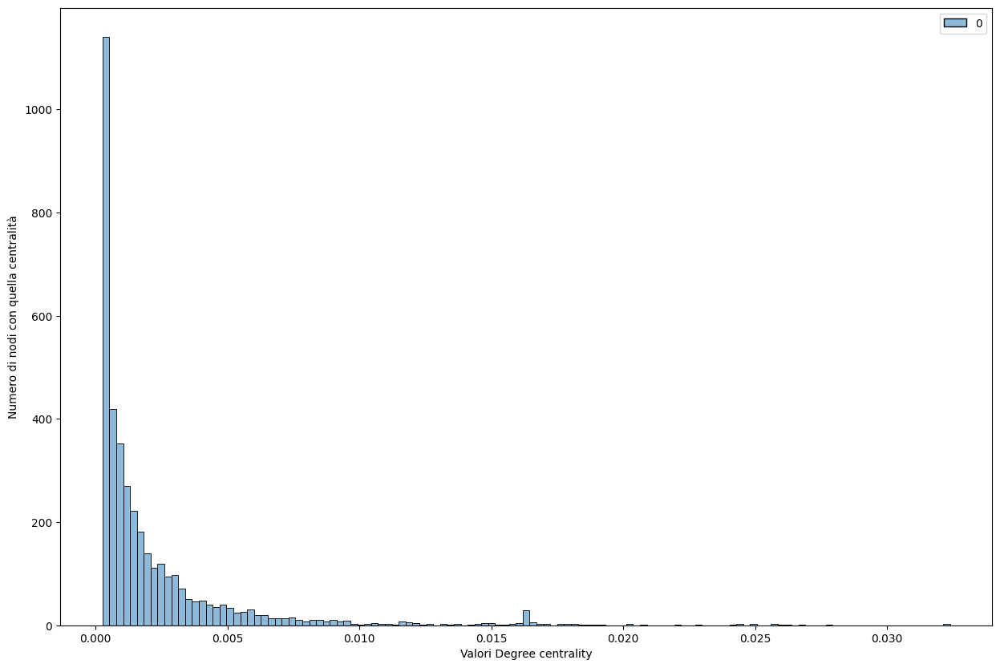

In [ ]:
plt.figure(figsize=(15,10))
sns.histplot(valori, kde=False)
plt.xlabel("Valori Degree centrality")
plt.ylabel("Numero di nodi con quella centralità")
#Valutiamo nuova degree centrality

In [ ]:
#Ricerca communities nei grafi
counter = 0
H=[nx.community.louvain_communities(G)]
for com in nx.community.louvain_communities(G):
    color = "#%06X" % randint(0, 0xFFFFFF)  
    counter += 1
    for nodosingolo in list(com):
        nx.set_node_attributes(G, {nodosingolo: color}, name="color")
counter# Numero communities trovate


18

Community numero 0
Numero di nodi: 67


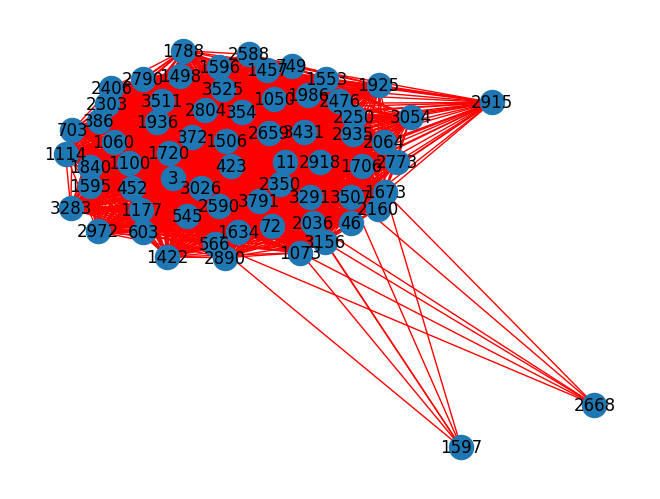

Community numero 1
Numero di nodi: 10


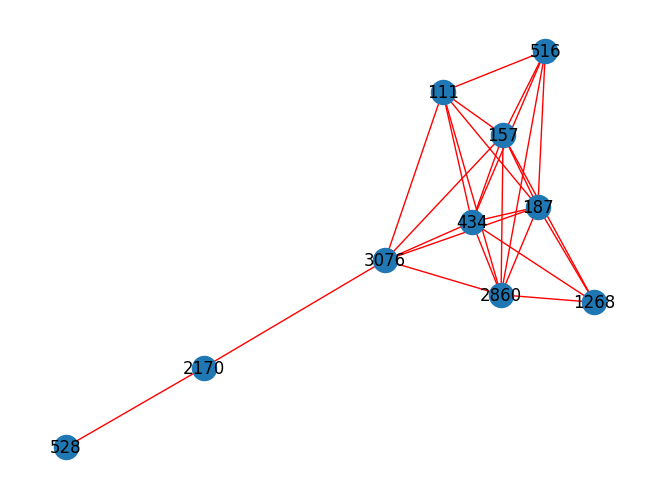

Community numero 2
Numero di nodi: 28


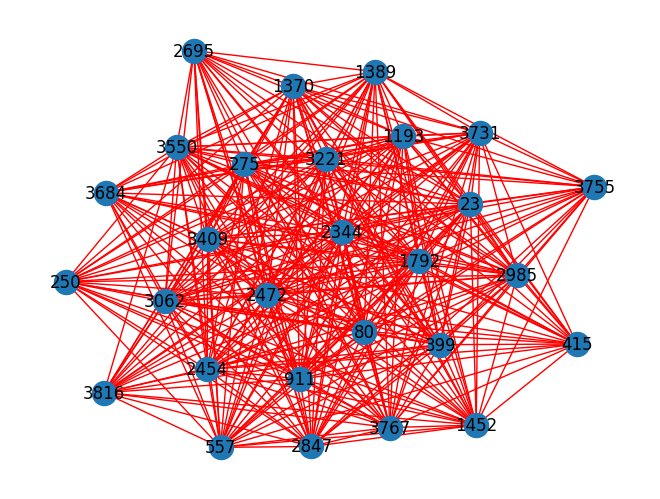

Community numero 3
Numero di nodi: 8


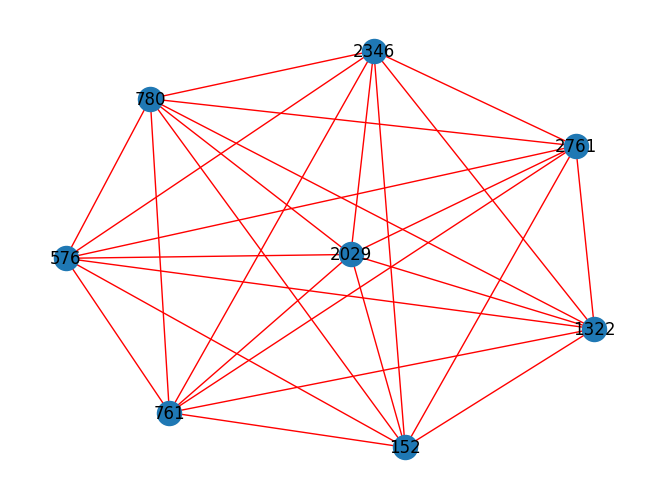

Community numero 4
Numero di nodi: 29


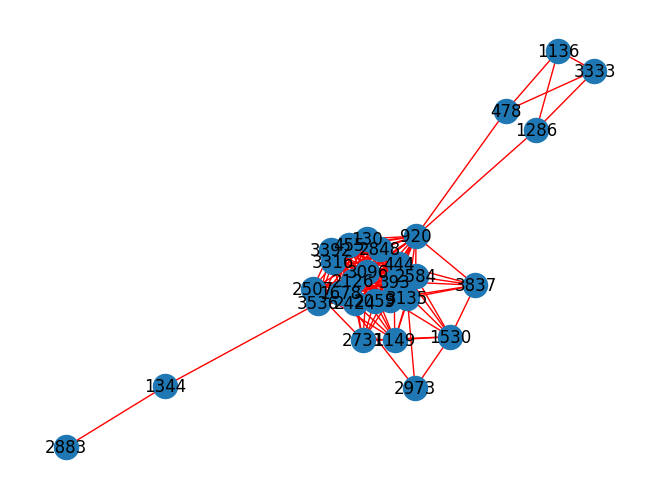

Community numero 5
Numero di nodi: 1


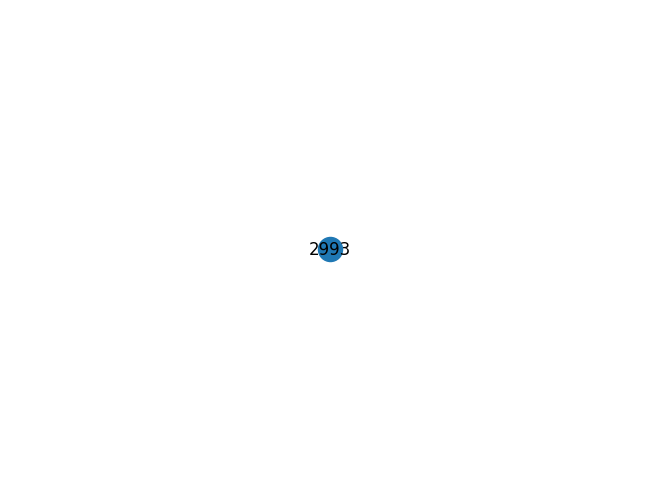

Community numero 6
Numero di nodi: 11


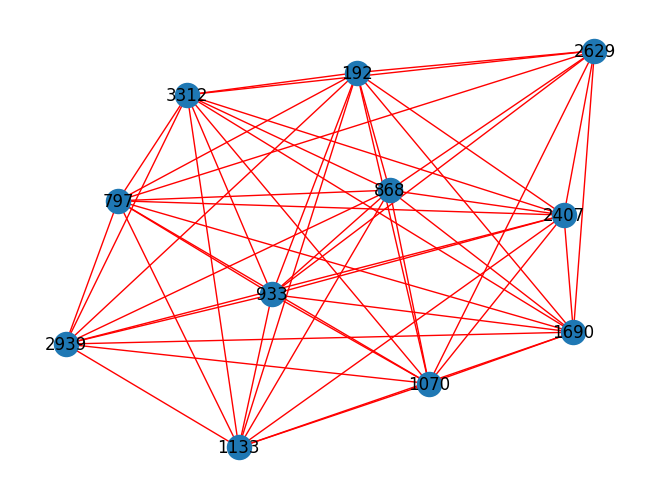

Community numero 7
Numero di nodi: 1


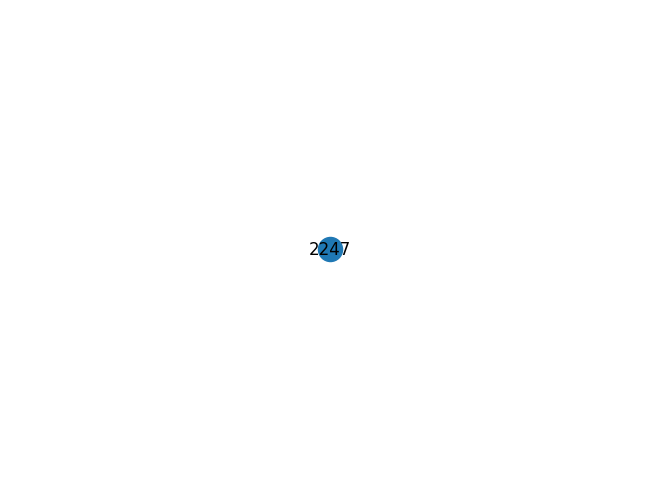

Community numero 8
Numero di nodi: 32


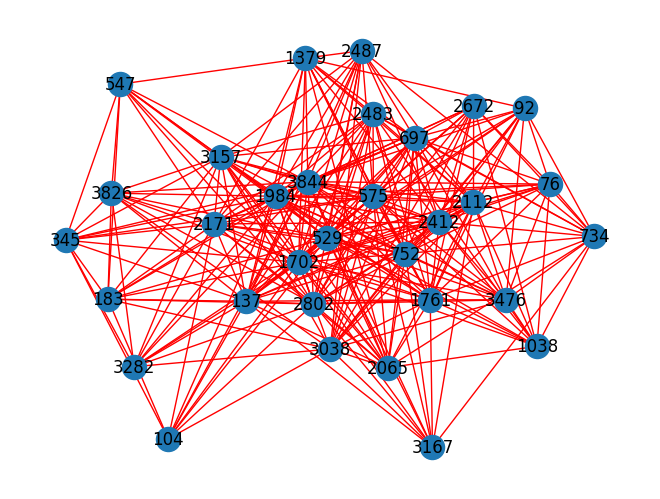

Community numero 9
Numero di nodi: 19


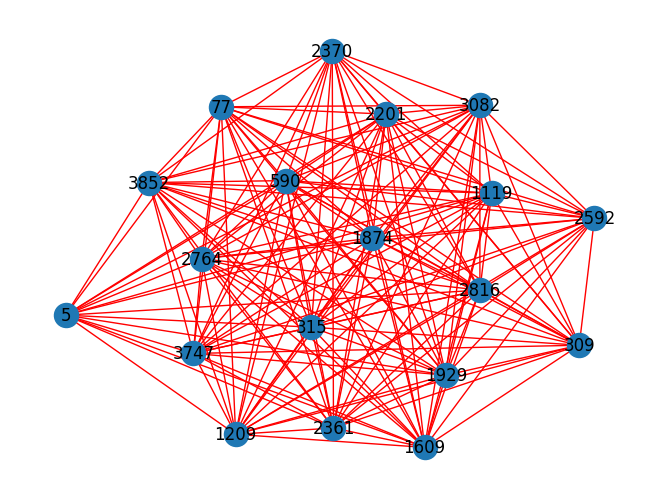

Community numero 10
Numero di nodi: 80


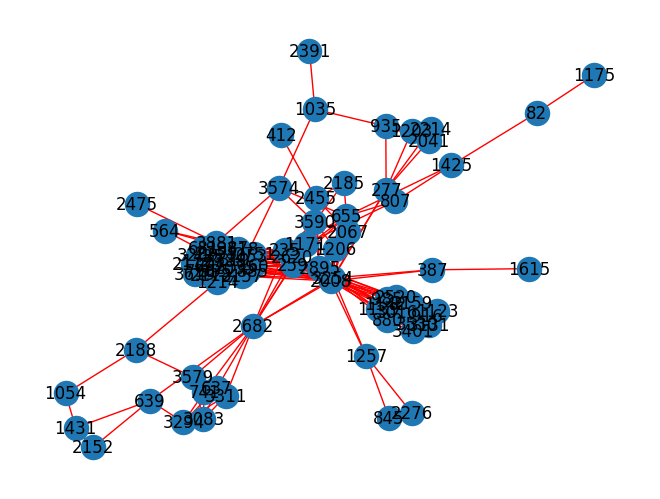

Community numero 11
Numero di nodi: 1


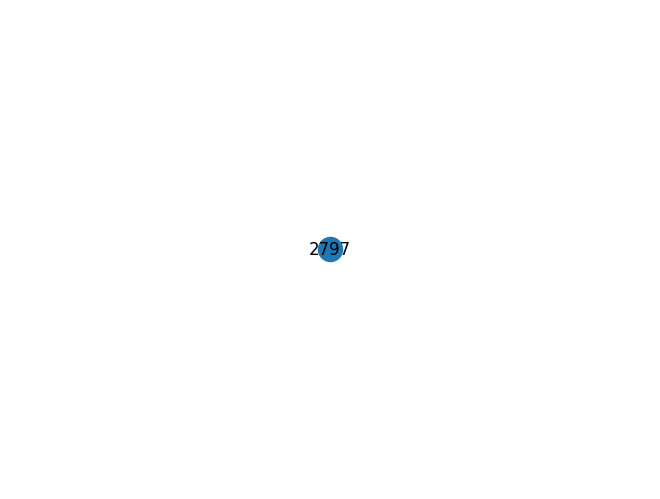

Community numero 12
Numero di nodi: 1


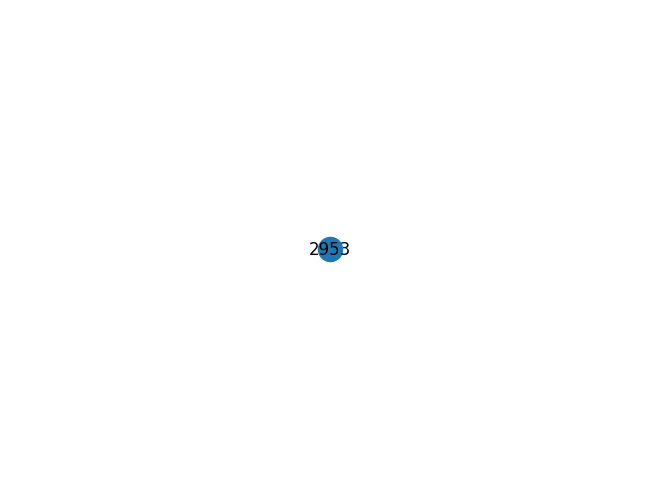

Community numero 13
Numero di nodi: 73


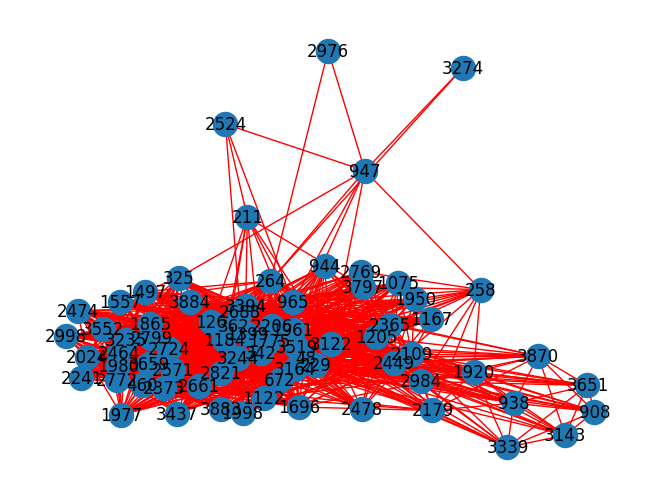

Community numero 14
Numero di nodi: 36


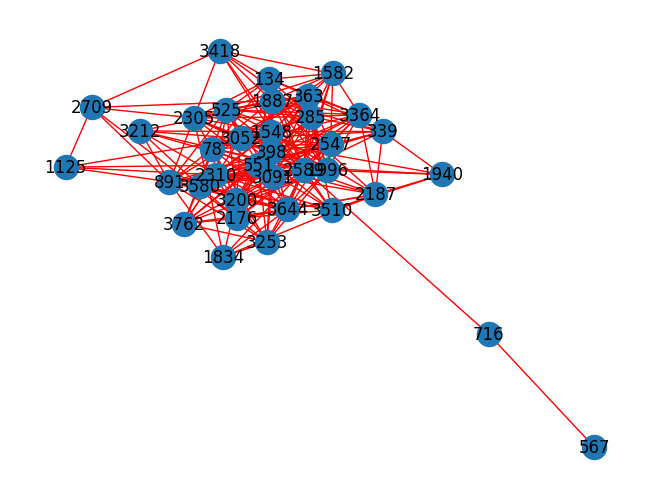

Community numero 15
Numero di nodi: 1


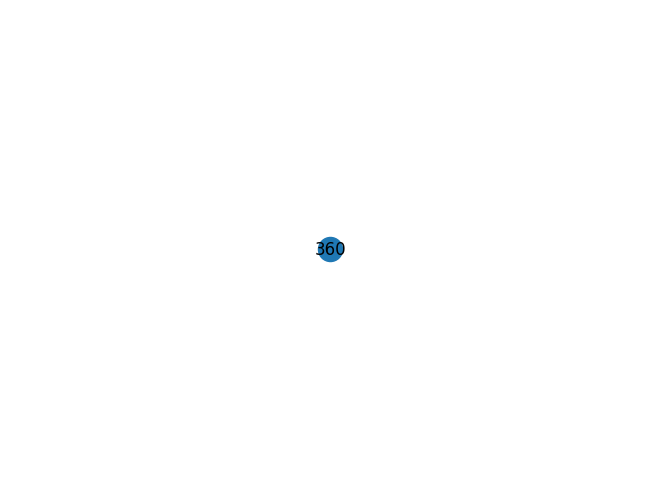

Community numero 16
Numero di nodi: 1


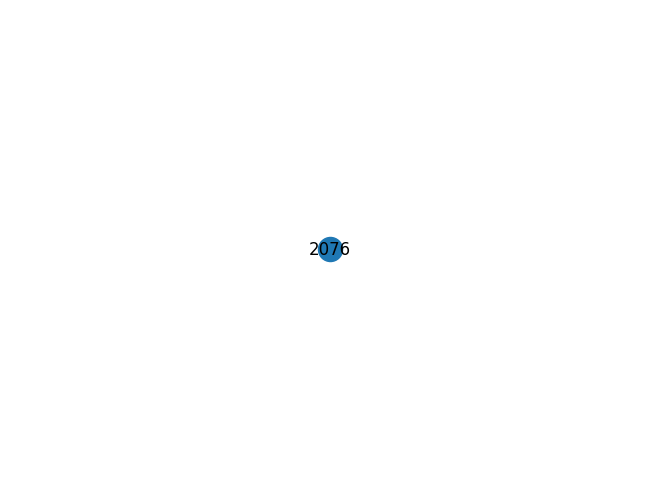

Community numero 17
Numero di nodi: 14


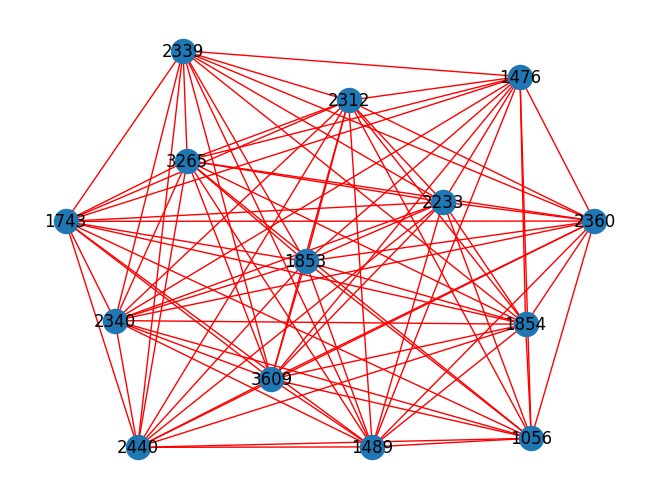

In [ ]:
plt.figure()
for i in range(len(nx.community.louvain_communities(G))):
    print("Community numero "+str(i))
    print("Numero di nodi: "+str(len(H[0][i])))
    nx.draw(nx.induced_subgraph(G,H[0][i]),with_labels=True,edge_color="red")
    plt.show()
#Stampiamo a schermo sia i grafi componenti che il numero della comunità e dei nodi che la formano

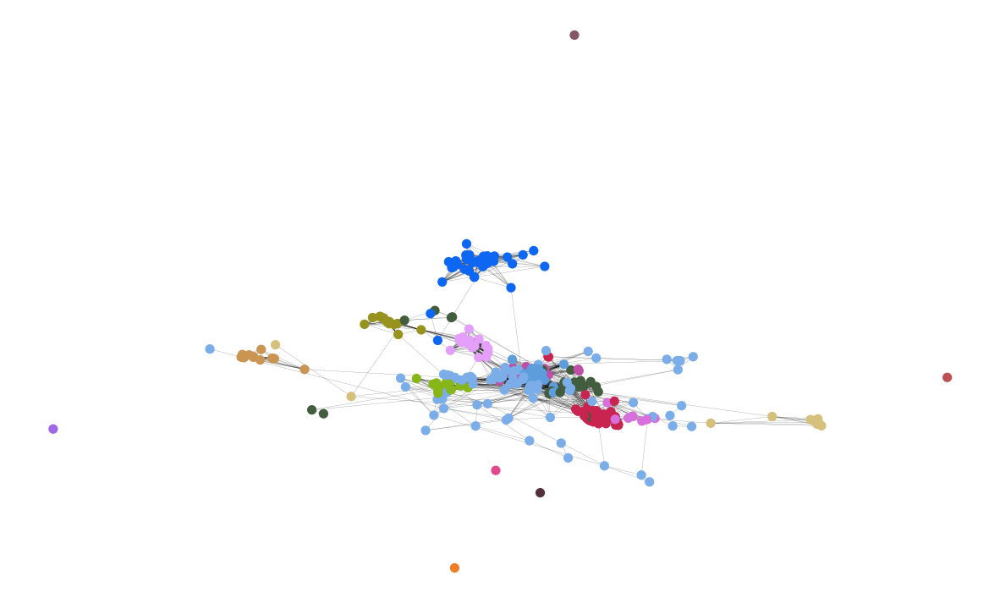

In [ ]:
nodiColorare=dict(list(G.nodes("color")))
plt.figure(figsize=(15, 9))
plt.axis("off")
nx.draw_networkx(
    G, pos=pos, node_size=50, with_labels=False,width=0.1, node_color=nodiColorare.values()
)
#Come si mostra ora il grafo, una volta evidenziate le comunità

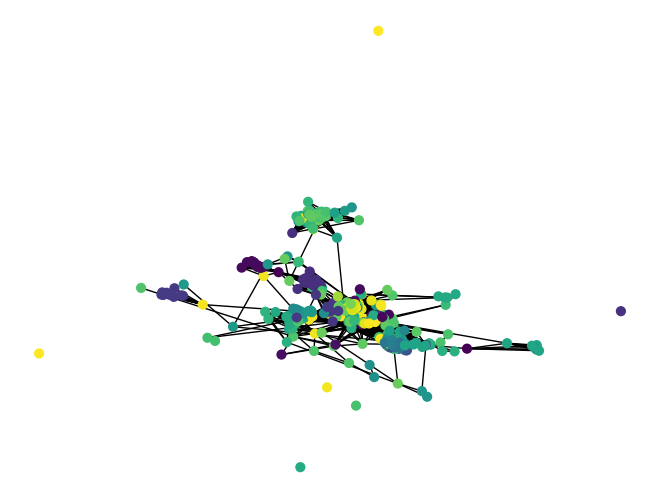

In [ ]:
# Trova le cliques nel grafo ridotto
cliques = list(nx.find_cliques(G))
# Creazione di un dizionario che assegna un colore diverso a ciascuna clique
colors = {}
for i, clique in enumerate(cliques):
    for node in clique:
        colors[node] = i

# Disegna il grafo intero colorando le cliques in modo differente
#pos = nx.spring_layout(us_graph)
node_colors = [colors[node] for node in us_graph.nodes()]
nx.draw(us_graph, pos, with_labels=False, node_color=node_colors, node_size=40)
#labels = {node: node for node in us_graph.nodes()}
#nx.draw_networkx_labels(us_graph, pos, labels=labels)

# Visualizza il grafo
plt.show()

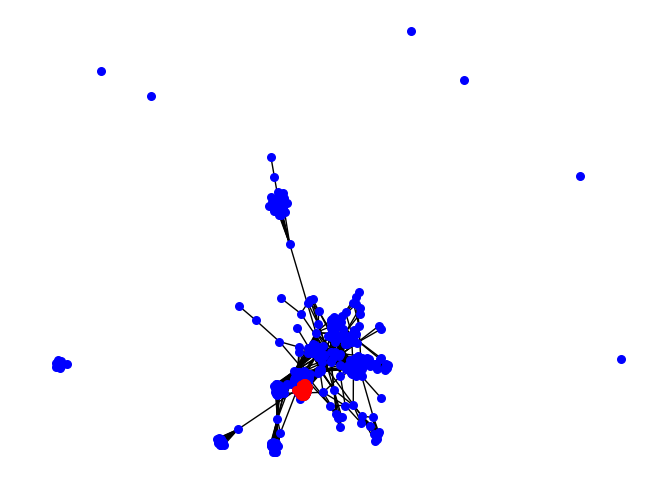

<Figure size 1500x1000 with 0 Axes>

In [ ]:
#Visualizza il grafo intero, vedi se riesci a far vedere il grafo ridotto
kcore=nx.k_core(G)
pos=nx.spring_layout(G)
nx.draw(G, pos, with_labels=False, node_color='b', node_size=30, font_size=1, font_color='w', font_weight='bold')
labels = {node: node for node in us_graph.nodes()}


# Evidenzia il k-core con un colore diverso
nx.draw(kcore, pos, with_labels=False, node_color='r', node_size=30, font_size=1, font_color='w', font_weight='bold')
labels = {node: node for node in kcore.nodes()}

plt.figure(figsize=(15,10))
# Visualizza il grafo
plt.show()